In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from collections import deque
import csv
import os
import pickle

In [2]:
# GLOBAL_PATH = "D:\NSU\NumericMethods\Project\Project_calculations\"

# Куда сохраняем данные:

In [3]:
LOC_LIST = ["D:\\", "NSU", "NumericMethods", "Project_calculations"]

In [4]:
folder_path = os.path.join(*LOC_LIST)

if os.path.exists(folder_path):
    print(f'Папка {folder_path} существует')
else:
    print(f'Папка {folder_path} не существует')

Папка D:\NSU\NumericMethods\Project_calculations существует


# Методы

In [5]:
def Euler_saving(f, t, bound):
    h = t[1] - t[0]
    n = len(t)
    k = len(bound)
    filename = f"Euler_N_{n}_k_{k}_T_{round(t[-1])}.csv"
    y = bound
    with open(os.path.join(*LOC_LIST, filename), 'w', newline='') as file:
        writer = csv.writer(file)
        for i in range(1, n):
            writer.writerow(y)
            y = y + h * f(y)
        writer.writerow(y)
    return True


def Euler_with_recalc_saving(f, t, bound):
    h = t[1] - t[0]
    n = len(t)
    k = len(bound)
    filename = f"Euler_with_recalc_N_{n}_k_{k}_T_{round(t[-1])}.csv"
    y = bound
    with open(os.path.join(*LOC_LIST, filename), 'w', newline='') as file:
        writer = csv.writer(file)
        for i in range(1, n):
            writer.writerow(y)
            tmp = y + h * f(y)
            y = y + (h / 2) * (f(y) + f(tmp))
        writer.writerow(y)
    return True


def Runge_Kutty_saving(f, t, bound):
    h = t[1] - t[0]
    n = len(t)
    k = len(bound)
    filename = f"Runge_Kutty_N_{n}_k_{k}_T_{round(t[-1])}.csv"
    y = bound
    with open(os.path.join(*LOC_LIST, filename), 'w', newline='') as file:
        writer = csv.writer(file)
        for i in range(1, len(t)):
            writer.writerow(y)
            k1 = h * f(y)
            k2 = h * f(y + k1 / 2)
            k3 = h * f(y + k2 / 2)
            k4 = h * f(y + k3)
            y = y + (k1 + (k2 + k3) * 2 + k4) / 6
        writer.writerow(y)
    return y


def Adams_Bashfort_saving(f, t, bound):
    h = t[1] - t[0]
    n = len(t)
    k = len(bound)
    filename = f"Adams_Bashfort_N_{n}_k_{k}_T_{round(t[-1])}.csv"
    y = bound
    with open(os.path.join(*LOC_LIST, filename), 'w', newline='') as file:
        writer = csv.writer(file)
        y_table = np.zeros((4, k))
        y_table[0] = bound
        for i in range(1, 4):
            writer.writerow(y)
            k1 = h * f(y)
            k2 = h * f(y + k1 / 2)
            k3 = h * f(y + k2 / 2)
            k4 = h * f(y + k3)
            y = y + (k1 + (k2 + k3) * 2 + k4) / 6
            y_table[i] = y
        writer.writerow(y)
        f_cache = deque([f(y_table[0]), f(y_table[1]), f(y_table[2]), f(y_table[3])])
        for i in range(4, len(t)):
            y = y + (h / 24) * (55 * f_cache[3] - 59 * f_cache[2] + 37 * f_cache[1] - 9 * f_cache[0])
            _ = f_cache.popleft()
            f_cache.append(f(y))
            writer.writerow(y)
    return y


def Adams_Bashfort_Molton_saving(f, t, bound):
    h = t[1] - t[0]
    n = len(t)
    k = len(bound)
    filename = f"Adams_Bashfort_Molton_N_{n}_k_{k}_T_{round(t[-1])}.csv"
    y = bound
    with open(os.path.join(*LOC_LIST, filename), 'w', newline='') as file:
        writer = csv.writer(file)
        y_table = np.zeros((4, k))
        y_table[0] = bound
        for i in range(1, 4):
            writer.writerow(y)
            k1 = h * f(y)
            k2 = h * f(y + k1 / 2)
            k3 = h * f(y + k2 / 2)
            k4 = h * f(y + k3)
            y = y + (k1 + (k2 + k3) * 2 + k4) / 6
            y_table[i] = y
        writer.writerow(y)
        f_cache = deque([f(y_table[0]), f(y_table[1]), f(y_table[2]), f(y_table[3])])
        for i in range(4, len(t)):
            tmp = y + (h / 24) * (55 * f_cache[3] - 59 * f_cache[2] + 37 * f_cache[1] - 9 * f_cache[0])
            _ = f_cache.popleft()
            f_cache.append(f(tmp))
            y = y + (h / 24) * (9 * f_cache[3] + 19 * f_cache[2] - 5 * f_cache[1] + f_cache[0])
            _ = f_cache.pop()
            f_cache.append(f(y))
            writer.writerow(y)
    return y

# Черновые тесты

In [6]:
# params = {
#     'k1': 77.27,
#     'k2': 8.375 * 1e-6,
#     'k3': 1 / 77.27,
#     'k4': 0.161,
# }


# def func(y):
#     k1 = params['k1']
#     k2 = params['k2']
#     k3 = params['k3']
#     k4 = params['k4']

#     y1, y2, y3 = y

#     dy1 = k1 * (y2 - y1 * y2 + y1 - k2 * y1 ** 2)
#     dy2 = (1 / k1) * (-y2 - y1 * y2 + y3)
#     dy3 = k4 * (y1 - y3)

#     return np.array([dy1, dy2, dy3])

# T = 20
# boundary = np.array([1, 0.1, 2.0])

In [7]:
# # N_set = np.array([10000 * 2 ** i + 1 for i in range(7)])
# N = 5_000_000
# t = np.linspace(0, T, N)
# Euler_saving(func, t, boundary)
# print(1, end=" ")
# Euler_with_recalc_saving(func, t, boundary)
# print(1, end=" ")
# Runge_Kutty_saving(func, t, boundary)
# print(1, end=" ")
# Adams_Bashfort_saving(func, t, boundary)
# print(1, end=" ")
# Adams_Bashfort_Molton_saving(func, t, boundary)
# print(1, end=" ")

In [8]:
# count_of_var = 3
# method = "Adams_Bashfort_Molton"
# filename = f"{method}_N_{N}_k_{count_of_var}_T_{T}.csv"
# arr = np.loadtxt(filename, delimiter=",", dtype=np.float64)
# for iter in range(count_of_var):
#   print(arr.shape, N - 1)
#   # print([arr[i][iter] for i in range(N - 1)])
#   data = [go.Scatter(x=np.linspace(0, T, N)[::100], y=[arr[i][iter] for i in range(N - 1)][::100], name=method)]
#   fig = go.Figure(data=data)
#   fig.update_layout(title=f'Method: {method}, func: F{iter+1}') #, yaxis_type="log"
#   fig.show()

# Тестирование тцветных линий

In [9]:
# from matplotlib.colors import LinearSegmentedColormap
# def g(x):
#     return x ** 2 / 10

In [10]:
# from matplotlib.colors import LinearSegmentedColormap
# def g(x):
#     return x ** 2 / 10

# K = 10
# x = np.linspace(-4, 4, 1000)
# y = [val + g(x) for val in np.linspace(0, 1, K)]


# colors = ["#FFD700", "#800080"]
# cmap = LinearSegmentedColormap.from_list("yellow_purple", colors, N=K)

# plt.figure(figsize=(10, 6))

# for i in range(K):
#     plt.plot(
#         x, 
#         y[i], 
#         color=cmap(i)
#     )

# plt.show()

# Задаём условия задачи

In [11]:
params = {
    'k1': 77.27,
    'k2': 8.375 * 1e-6,
    'k3': 1 / 77.27,
    'k4': 0.161,
}


def func(y):
    k1 = params['k1']
    k2 = params['k2']
    k3 = params['k3']
    k4 = params['k4']

    y1, y2, y3 = y

    dy1 = k1 * (y2 - y1 * y2 + y1 - k2 * y1 ** 2)
    dy2 = (1 / k1) * (-y2 - y1 * y2 + y3)
    dy3 = k4 * (y1 - y3)

    return np.array([dy1, dy2, dy3])


boundary = np.array([4.0, 1.1, 4.0])

In [12]:
T = 10
N_set = np.array([2_000_000 * 2 ** i + 1 for i in range(8)])
# for N in N_set:
#   t = np.linspace(0, T, N)
#   Euler_saving(func, t, boundary)
#   Euler_with_recalc_saving(func, t, boundary)
#   Runge_Kutty_saving(func, t, boundary)
#   Adams_Bashfort_saving(func, t, boundary)
#   Adams_Bashfort_Molton_saving(func, t, boundary)

# Подсчёт порядка и погрешностей

In [13]:
methods = ["Euler", "Euler_with_recalc",
           "Runge_Kutty", "Adams_Bashfort",
           "Adams_Bashfort_Molton"]
Results = {"grid": [],
           "Euler": dict(), "Euler_with_recalc": dict(),
           "Runge_Kutty": dict(), "Adams_Bashfort": dict(),
           "Adams_Bashfort_Molton": dict()}
count_of_var = 3

In [15]:
# for method in methods:
#   Results[method]["rel_diff"] = []
#   Results[method]["abs_diff"] = []
#   diffnorms = np.zeros(len(N_set) - 1)
#   for i in range(len(N_set) - 1):
#     N1 = N_set[i]
#     N2 = N_set[i + 1]
#     filename1 = f"{method}_N_{N1}_k_{count_of_var}_T_{T}.csv"
#     arr1 = np.loadtxt(os.path.join(*LOC_LIST, filename1), delimiter=",", dtype=np.float64)
#     filename2 = f"{method}_N_{N2}_k_{count_of_var}_T_{T}.csv"
#     arr2 = np.loadtxt(os.path.join(*LOC_LIST, filename2), delimiter=",", dtype=np.float64)

#     diff = arr2[::2] - arr1
#     diffnorm = np.linalg.norm(diff, ord=np.inf)
#     arr1norm = np.linalg.norm(arr1, ord=np.inf)
#     diffnorms[i] = diffnorm
#     Results[method]["abs_diff"].append(diffnorm)
#     Results[method]["rel_diff"].append(diffnorm / arr1norm)

#   order_of_convergence = np.zeros(len(N_set) - 2)
#   for i in range(len(N_set) - 2):
#     order_of_convergence[i] = round(np.log2(diffnorms[i] / diffnorms[i + 1]), 3)
#   print(f"Порядок сходимости {method}: {order_of_convergence}")

Порядок сходимости Euler: [1. 1. 1. 1. 1. 1.]
Порядок сходимости Euler_with_recalc: [ 1.998  2.001  2.029  2.569 -0.233  0.441]
Порядок сходимости Runge_Kutty: [-1.486  2.006 -2.365 -1.861 -0.638  0.049]
Порядок сходимости Adams_Bashfort: [   nan  1.98  -2.331 -1.863 -0.638  0.049]
Порядок сходимости Adams_Bashfort_Molton: [-1.486  2.005 -2.364 -1.861 -0.638  0.049]


In [22]:
# Results["grid"] = list(N_set)
# Results

{'grid': [2000001,
  4000001,
  8000001,
  16000001,
  32000001,
  64000001,
  128000001,
  256000001],
 'Euler': {'rel_diff': [0.00024129522575594412,
   0.00012064975197018906,
   6.03254093797031e-05,
   3.0162808376205154e-05,
   1.5081475139527319e-05,
   7.5407210975409324e-06,
   3.7703767562532174e-06],
  'abs_diff': [28.862706613893973,
   14.43160826541607,
   7.215867707433586,
   3.607946199319894,
   1.8039815723371102,
   0.9019888122744772,
   0.4509963439176989]},
 'Euler_with_recalc': {'rel_diff': [1.8760657066350078e-08,
   4.696518968732373e-09,
   1.1731546153982455e-09,
   2.874713131983154e-10,
   4.84349499356828e-11,
   5.6937389746794436e-11,
   4.19409794273955e-11],
  'abs_diff': [0.002244069565610989,
   0.0005617775137036047,
   0.000140327737930563,
   3.4386089072651563e-05,
   5.793581572325918e-06,
   6.810607060633422e-06,
   5.016800592517242e-06]},
 'Runge_Kutty': {'rel_diff': [1.9066590485339703e-12,
   5.340740472104877e-12,
   1.3296016759059797e-

## Сохраняем результаты в файл

In [ ]:
# file = open("Differences.pickle", 'wb') # dump information to that file 
# pickle.dump(data, file) # close the file 
# file.close()

## Проверка, что всё нормально сохранилось

In [28]:
file = open("errors/Differences.pickle", "rb")
data = pickle.load(file)
file.close()

print(data)

{'grid': [2000001, 4000001, 8000001, 16000001, 32000001, 64000001, 128000001, 256000001], 'Euler': {'rel_diff': [0.00024129522575594412, 0.00012064975197018906, 6.03254093797031e-05, 3.0162808376205154e-05, 1.5081475139527319e-05, 7.5407210975409324e-06, 3.7703767562532174e-06], 'abs_diff': [28.862706613893973, 14.43160826541607, 7.215867707433586, 3.607946199319894, 1.8039815723371102, 0.9019888122744772, 0.4509963439176989]}, 'Euler_with_recalc': {'rel_diff': [1.8760657066350078e-08, 4.696518968732373e-09, 1.1731546153982455e-09, 2.874713131983154e-10, 4.84349499356828e-11, 5.6937389746794436e-11, 4.19409794273955e-11], 'abs_diff': [0.002244069565610989, 0.0005617775137036047, 0.000140327737930563, 3.4386089072651563e-05, 5.793581572325918e-06, 6.810607060633422e-06, 5.016800592517242e-06]}, 'Runge_Kutty': {'rel_diff': [1.9066590485339703e-12, 5.340740472104877e-12, 1.3296016759059797e-12, 6.8496161344096074e-12, 2.487500003281973e-11, 3.870236612372175e-11, 3.740252753197377e-11], '

In [29]:
data.keys()

dict_keys(['grid', 'Euler', 'Euler_with_recalc', 'Runge_Kutty', 'Adams_Bashfort', 'Adams_Bashfort_Molton'])

## Прореживаем данные и сохраняем <br>(чтобы потом графики рисовать)

In [30]:
for method in methods:
    diffnorms = np.zeros(len(N_set) - 1)
    for i in range(len(N_set)):
        N = N_set[i]
        k = (N - 1) // 20000
        filename = f"{method}_N_{N}_k_{count_of_var}_T_{T}.csv"
        arr = np.loadtxt(os.path.join(*LOC_LIST, filename), delimiter=",", dtype=np.float64)

        sparse_arr = arr[::k]
        np.savetxt(f"sparsed_data/Sparsed_{filename}", sparse_arr, delimiter=',')


## На блок ниже можно не смотреть

In [8]:
# method = "Adams_Bashfort"
# N_ab = [20_000_001, 40_000_001, 80_000_001]
# diffnorms = np.zeros(len(N_ab) - 1)
# for i in range(len(N_ab) - 1):
#     N1 = N_ab[i]
#     N2 = N_ab[i + 1]
#     filename1 = GLOBAL_PATH + f"{method}_N_{N1}_k_{count_of_var}_T_{T}.csv"
#     arr1 = np.loadtxt(filename1, delimiter=",", dtype=np.float64)
#     filename12 = GLOBAL_PATH + f"{method}_N_{N2}_k_{count_of_var}_T_{T}.csv"
#     arr2 = np.loadtxt(filename12, delimiter=",", dtype=np.float64)
#     diff = arr2[::2] - arr1
#     diffnorms[i] = np.linalg.norm(diff, ord=np.inf)
# order_of_convergence = np.zeros(len(N_ab) - 2)
# for i in range(len(N_ab) - 2):
#     order_of_convergence[i] = np.log2(diffnorms[i] / diffnorms[i + 1])
# print(f"Порядок сходимости {method}: {order_of_convergence}")

KeyboardInterrupt: 

# Абсолютные погрешности (УСТАРЕВШИЙ КОД)

In [11]:
methods_ord = {"Euler": 1, "Euler_with_recalc": 2,
               "Runge_Kutty": 2, "Adams_Bashfort": 2,
               "Adams_Bashfort_Molton": 2}

Table_errors = np.zeros((len(N_set) - 1, 4))

In [12]:
Methods_without_AB = ["Euler", "Euler_with_recalc",
                      "Runge_Kutty", "Adams_Bashfort_Molton"]

for q in range(len(Methods_without_AB)):
    method = Methods_without_AB[q]
    diffnorms = np.zeros(len(N_set) - 1)
    for i in range(len(N_set) - 1):
        N1 = N_set[i]
        N2 = N_set[i + 1]
        filename1 = f"{method}_N_{N1}_k_{count_of_var}_T_{T}.csv"
        arr1 = np.loadtxt(filename1, delimiter=",", dtype=np.float64)
        filename12 = f"{method}_N_{N2}_k_{count_of_var}_T_{T}.csv"
        arr2 = np.loadtxt(filename12, delimiter=",", dtype=np.float64)
        diff = arr2[::2] - arr1
        diffnorms[i] = np.linalg.norm(diff, ord=np.inf)

        Table_errors[i][q] = 2 ** methods_ord[method] / (2 ** methods_ord[method] - 1) * diffnorms[i]

In [13]:
df = pd.DataFrame(Table_errors, columns=Methods_without_AB)
print(df)

       Euler  Euler_with_recalc   Runge_Kutty  Adams_Bashfort_Molton
0  57.725413           0.002992  3.040885e-07           3.041372e-07
1  28.863217           0.000749  8.517820e-07           8.518502e-07
2  14.431735           0.000187  2.120550e-07           2.122011e-07


In [14]:
df["h"] = pd.Series([25 / 5e6, 25 / 1e7, 25 / 2e7])

In [15]:
print(df)

       Euler  Euler_with_recalc   Runge_Kutty  Adams_Bashfort_Molton         h
0  57.725413           0.002992  3.040885e-07           3.041372e-07  0.000005
1  28.863217           0.000749  8.517820e-07           8.518502e-07  0.000003
2  14.431735           0.000187  2.120550e-07           2.122011e-07  0.000001


In [19]:
N_set_ab = [20_000_001, 40_000_001, 80_000_001]
Table_errors = np.zeros((len(N_set) - 1, 1))
method = "Adams_Bashfort"
diffnorms = np.zeros(len(N_set) - 1)
for i in range(len(N_set) - 1):
    N1 = N_set[i]
    N2 = N_set[i + 1]
    filename1 = f"{method}_N_{N1}_k_{count_of_var}_T_{T}.csv"
    arr1 = np.loadtxt(filename1, delimiter=",", dtype=np.float64)
    filename12 = f"{method}_N_{N2}_k_{count_of_var}_T_{T}.csv"
    arr2 = np.loadtxt(filename12, delimiter=",", dtype=np.float64)
    diff = arr2[::2] - arr1
    # print(arr2[::2], arr1)
    # print("-----------------------------------")
    diffnorms[i] = np.linalg.norm(diff, ord=np.inf)

    Table_errors[i][0] = 2 ** methods_ord[method] / (2 ** methods_ord[method] - 1) * diffnorms[i]


[[4.         1.1        4.        ]
 [4.00027039 1.0999999  4.        ]
 [4.00054077 1.09999981 4.        ]
 ...
 [       nan        nan        nan]
 [       nan        nan        nan]
 [       nan        nan        nan]] [[4.         1.1        4.        ]
 [4.00027039 1.0999999  4.        ]
 [4.00054077 1.09999981 4.        ]
 ...
 [       nan        nan        nan]
 [       nan        nan        nan]
 [       nan        nan        nan]]
-----------------------------------
[[4.00000000e+00 1.10000000e+00 4.00000000e+00]
 [4.00013520e+00 1.09999995e+00 4.00000000e+00]
 [4.00027039e+00 1.09999990e+00 4.00000000e+00]
 ...
 [1.00061305e+00 1.63218174e+03 1.04558438e+03]
 [1.00061305e+00 1.63218167e+03 1.04558396e+03]
 [1.00061305e+00 1.63218160e+03 1.04558354e+03]] [[4.         1.1        4.        ]
 [4.0001352  1.09999995 4.        ]
 [4.00027039 1.0999999  4.        ]
 ...
 [       nan        nan        nan]
 [       nan        nan        nan]
 [       nan        nan        nan]]
----

In [18]:
df = pd.DataFrame(Table_errors, columns=["Adams_Bashfort"])
df["h"] = pd.Series([25 / 2e7, 25 / 4e7, 25 / 8e7])
df

,Adams_Bashfort,h
0,NaN,1.250000e-06
1,NaN,6.250000e-07
2,2.166447e-07,3.125000e-07


# Модифицированная система (катализатор/ингибитор)

In [41]:
params = {
    'k1': 77.27,
    'k2': 8.375 * 1e-6,
    'k3': 1 / 77.27,
    'k4': 0.161,
    'f': 1,
    's': 80,
    'q': 8e-6,
    'w': 0.16,
}


def h(x):
    return (params['q'] * x ** 2 - x) / (1 - x)


def h_der(x):
    return (-params['q'] * x ** 2 + 2 * params['q'] * x - 1) / (1 - x) ** 2


def func(y):
    f = params['f']
    q = params['q']
    s = params['s']
    w = params['w']

    x, z = y

    dx = (-h(x) * (1 + x) + f * z) / (s * h_der(x))
    dz = w * (x - z)

    return np.array([dx, dz])


y0 = [4.0, 1.1]
T = 50

In [42]:
# N_set = np.array([10000 * 2 ** i + 1 for i in range(7)])
N = 10_000_000
t = np.linspace(0, T, N)
# Euler_saving(func, t, y0)
# print(1, end=" ")
# Euler_with_recalc_saving(func, t, y0)
# print(1, end=" ")
# Runge_Kutty_saving(func, t, y0)
# print(1, end=" ")
# Adams_Bashfort_saving(func, t, y0)
# print(1, end=" ")
Adams_Bashfort_Molton_saving(func, t, y0)
print(1, end=" ")

1 

(10000000, 2) 9999999


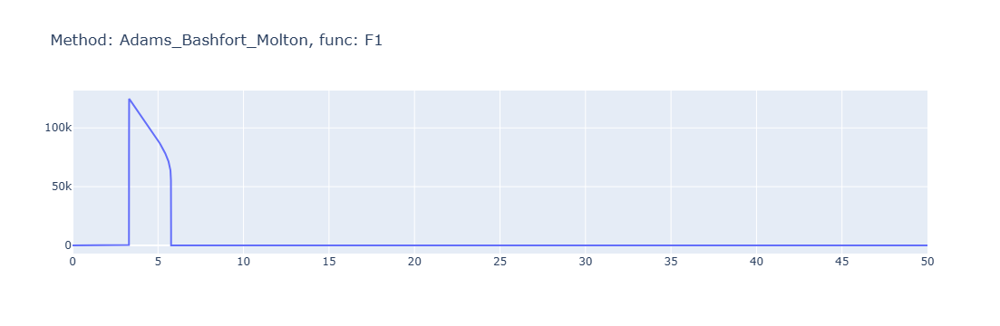

(10000000, 2) 9999999


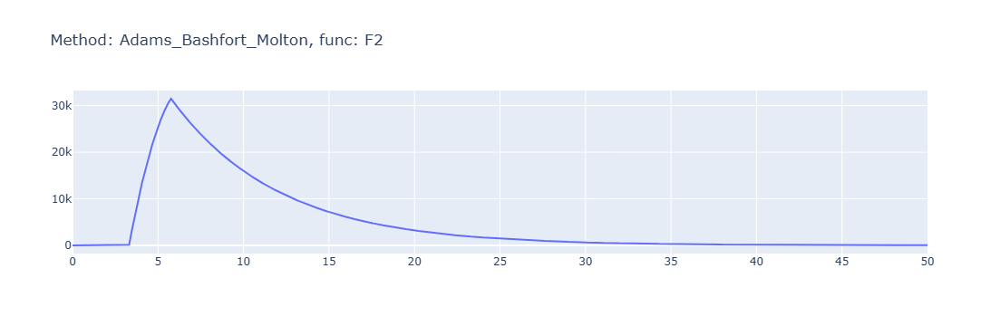

In [43]:
count_of_var = 2
method = "Adams_Bashfort_Molton"
filename = f"{method}_N_{N}_k_{count_of_var}_T_{T}.csv"
arr = np.loadtxt(filename, delimiter=",", dtype=np.float64)
for iter in range(count_of_var):
    print(arr.shape, N - 1)
    # print([arr[i][iter] for i in range(N - 1)])
    data = [go.Scatter(x=np.linspace(0, T, N)[::100], y=[arr[i][iter] for i in range(N - 1)][::100], name=method)]
    fig = go.Figure(data=data)
    fig.update_layout(title=f'Method: {method}, func: F{iter + 1}')  #, yaxis_type="log"
    fig.show()